# **Shared**

In [1]:
!git clone https://github.com/ayamohamdd/IP-25.git
import tensorflow
import keras
from google.colab import drive
import os
from PIL import Image
import glob
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import numpy as np
from PIL import Image, ImageOps
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate, Dropout
from tensorflow.keras.metrics import MeanIoU, Precision, Recall
from tensorflow.keras.layers import Flatten  # Import Flatten from tf.keras.layers
from tensorflow.keras import backend as K
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.metrics import Metric
import os
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

import imageio
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.layers import Conv2D, BatchNormalization, MaxPool2D
from tensorflow.keras.layers import Input, Conv2DTranspose, Concatenate, Activation
import tensorflow_datasets as tfds
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

Cloning into 'IP-25'...
remote: Enumerating objects: 709, done.
remote: Counting objects: 100% (6/6), done.
remote: Compressing objects: 100% (6/6), done.
remote: Total 709 (delta 0), reused 0 (delta 0), pack-reused 703 (from 2)
Receiving objects: 100% (709/709), 403.03 MiB | 41.77 MiB/s, done.
Updating files: 100% (691/691), done.


In [2]:
input_size = (544, 960, 3)
num_of_classes = 8
COLOR_TO_CLass = {
    (0, 0, 0): 0,        # Background clutter
    (128, 0, 0): 1,      # Building
    (128, 64, 128): 2,   # Road
    (0, 128, 0): 3,      # Tree
    (128, 128, 0): 4,    # Low vegetation
    (64, 0, 128): 5,     # Moving car
    (192, 0, 192): 6,    # Static car
    (64, 64, 0): 7       # Human
}

CLASS_TO_COLOR = {v: k for k, v in COLOR_TO_CLass.items()}
BATCH_SIZE = 2
EPOCHS = 20
BUFFER_SIZE = 500

In [3]:
def loaddata():
  global train_steps_per_epoch
  global val_steps_per_epoch

  train_image_path = '/content/IP-25/train_data/Images'
  train_mask_path = '/content/IP-25/train_data/Labels'
  val_image_path = '/content/IP-25/val_data/Images'
  val_mask_path = '/content/IP-25/val_data/Labels'
  train_image_list = sorted([os.path.join(train_image_path, i) for i in os.listdir(train_image_path)])
  train_mask_list = sorted([os.path.join(train_mask_path, i) for i in os.listdir(train_mask_path)])
  val_image_list = sorted([os.path.join(val_image_path, i) for i in os.listdir(val_image_path)])
  val_mask_list = sorted([os.path.join(val_mask_path, i) for i in os.listdir(val_mask_path)])



  train_steps_per_epoch = len(train_image_list) // BATCH_SIZE
  val_steps_per_epoch = len(val_image_list) // BATCH_SIZE

  train_image_filenames = tf.constant(train_image_list)
  train_masks_filenames = tf.constant(train_mask_list)

  train_dataset = tf.data.Dataset.from_tensor_slices((train_image_filenames, train_masks_filenames))


  val_image_filenames = tf.constant(val_image_list)
  val_masks_filenames = tf.constant(val_mask_list)

  val_dataset = tf.data.Dataset.from_tensor_slices((val_image_filenames, val_masks_filenames))



  train_image_ds = train_dataset.map(process_path)
  train_processed_image_ds = train_image_ds.map(preprocess)


  val_image_ds = val_dataset.map(process_path)
  val_processed_image_ds = val_image_ds.map(preprocess)


  return train_processed_image_ds,val_processed_image_ds


def rgb_to_class(mask):
    height, width = mask.shape[0], mask.shape[1]
    mask_classes = np.zeros((height, width), dtype=np.int32)

    for color, class_idx in COLOR_TO_CLass.items():
        color_mask = np.all(mask == color, axis=-1)
        mask_classes[color_mask] = class_idx

    return mask_classes

def class_to_rgb(predicted_mask):
    colorized_image = np.zeros((predicted_mask.shape[0], predicted_mask.shape[1], 3), dtype=np.uint8)
    for class_idx, color in CLASS_TO_COLOR.items():
          # Find the indices where the mask is True for the current class
        indices = np.where(predicted_mask == class_idx)
        # Assign the color to the corresponding indices in the colorized image
        colorized_image[indices[0], indices[1], :] = color
    return colorized_image



def process_path(image_path, mask_path):
    img = tf.io.read_file(image_path)
    img = tf.image.decode_jpeg(img)
    img = tf.cast(img, tf.float32)

    mask = tf.io.read_file(mask_path)
    mask = tf.image.decode_png(mask, channels=3)
    return img, mask

def preprocess(image, mask):
    input_image = tf.image.resize(image, [input_size[0], input_size[1]], method='nearest')
    input_mask = tf.image.resize(mask,[input_size[0], input_size[1]], method='nearest')

    # change the colors into index
    input_mask = tf.numpy_function(rgb_to_class, [input_mask], tf.int32)
    input_mask.set_shape([input_size[0], input_size[1]])

    input_image = input_image / 255.0

    return input_image, input_mask


def display(display_list):
    plt.figure(figsize=(15, 15))

    title = ['Input Image', 'True Mask', 'Predicted Mask']

    for i in range(len(display_list)):
        plt.subplot(1, len(display_list), i+1)
        plt.title(title[i])
        plt.imshow(tf.keras.preprocessing.image.array_to_img(display_list[i]))
        plt.axis('off')
    plt.show()


def create_mask(pred_mask):
    pred_mask = tf.argmax(pred_mask, axis=-1)
    pred_mask = pred_mask[..., tf.newaxis]
    visual_mask = class_to_rgb(pred_mask[0].numpy())
    return visual_mask


def show_predictions(dataset=None, num=1):
    for image, mask in dataset.take(num):
        pred_mask = unet.predict(image)
        visual_mask = class_to_rgb(mask[0].numpy())
        display([image[0], visual_mask, create_mask(pred_mask)])

def dice_coefficient(y_true, y_pred):
    y_pred = K.argmax(y_pred, axis=-1)
    y_true = K.cast(y_true, tf.int32)
    y_pred = K.cast(y_pred, tf.int32)
    intersection = K.sum(K.cast(y_true == y_pred, tf.float32))
    return 2 * intersection / (K.sum(K.cast(y_true, tf.float32)) + K.sum(K.cast(y_pred, tf.float32)))

def precision(y_true, y_pred):
    y_pred = K.argmax(y_pred, axis=-1)
    true_positive = K.sum(K.cast((y_true == 1) & (y_pred == 1), tf.float32))
    false_positive = K.sum(K.cast((y_true == 0) & (y_pred == 1), tf.float32))
    return true_positive / (true_positive + false_positive + K.epsilon())

def recall(y_true, y_pred):
    y_pred = K.argmax(y_pred, axis=-1)
    true_positive = K.sum(K.cast((y_true == 1) & (y_pred == 1), tf.float32))
    false_negative = K.sum(K.cast((y_true == 1) & (y_pred == 0), tf.float32))
    return true_positive / (true_positive + false_negative + K.epsilon())

def jaccard_index(y_true, y_pred):
    y_pred = K.argmax(y_pred, axis=-1)
    y_true = K.cast(y_true, tf.int32)
    y_pred = K.cast(y_pred, tf.int32)
    intersection = K.sum(K.cast(y_true == y_pred, tf.float32))
    union = K.sum(K.cast(y_true, tf.float32)) + K.sum(K.cast(y_pred, tf.float32)) - intersection
    return intersection / (union + K.epsilon())

def pixel_accuracy(y_true, y_pred):
    y_pred = K.argmax(y_pred, axis=-1)
    y_true = K.cast(y_true, tf.int32)
    y_pred = K.cast(y_pred, tf.int32)
    correct_pixels = K.sum(K.cast(y_true == y_pred, tf.float32))
    total_pixels = tf.cast(tf.size(y_true), tf.float32)
    return correct_pixels / total_pixels

In [4]:
# only use final data
train_Data ,val_Data = loaddata()

train_Data.batch(BATCH_SIZE)
train_finalData = train_Data.cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

val_Data.batch(BATCH_SIZE)
val_finalData = val_Data.cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

# **U-NET**

## tial 1
dropout 0.1 epoch 20 learning rate 0.001 with ReduceRlonPlateu  adam optimizer and batchsize 2

In [ ]:
def double_conv_block(inputs, num_filters, dropout_rate=0.1):
    x = Conv2D(num_filters, 3, padding="same", kernel_initializer='he_normal')(inputs)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = Conv2D(num_filters, 3, padding="same", kernel_initializer='he_normal')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    if dropout_rate > 0:
        x = Dropout(dropout_rate)(x)

    return x

def encoder_block(inputs, num_filters):
    x = double_conv_block(inputs, num_filters)
    p = MaxPool2D((2, 2), padding='same')(x)
    return x, p

def decoder_block(inputs, skip, num_filters):
    x = Conv2DTranspose(num_filters, (2, 2), strides=2, padding="same")(inputs)
    x = Concatenate()([x, skip])
    x = double_conv_block(x, num_filters)
    return x

def build_unet(input_shape):
    inputs = Input(input_shape)
    s1, p1 = encoder_block(inputs, 32)
    s2, p2 = encoder_block(p1, 64)
    s3, p3 = encoder_block(p2, 128)
    s4, p4 = encoder_block(p3, 256)

    b1 = double_conv_block(p4, 512)

    d1 = decoder_block(b1, s4, 256)
    d2 = decoder_block(d1, s3, 128)
    d3 = decoder_block(d2, s2, 64)
    d4 = decoder_block(d3, s1, 32)

    outputs = Conv2D(num_of_classes, 1, padding="same", activation="softmax")(d4)
    return tf.keras.models.Model(inputs, outputs, name="UNET")


In [ ]:
unet = build_unet(input_size)
unet.compile(
    optimizer=tf.keras.optimizers.Adam(),
    loss='sparse_categorical_crossentropy',
    metrics=[pixel_accuracy, dice_coefficient, precision, recall, jaccard_index]
)
callbacks = [
    tf.keras.callbacks.ModelCheckpoint('best_model2.keras', save_best_only=True, monitor='val_loss'),
    tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True),
    tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=1e-6)
]

history = unet.fit(
    train_finalData,
    epochs=EPOCHS,
    validation_data=val_finalData,
    callbacks=callbacks
)


Epoch 1/40
100/100 ━━━━━━━━━━━━━━━━━━━━ 119s 539ms/step - dice_coefficient: 0.1895 - jaccard_index: 0.1083 - loss: 1.7216 - pixel_accuracy: 0.3754 - precision: 0.6287 - recall: 0.7159 - val_dice_coefficient: 0.0194 - val_jaccard_index: 0.0098 - val_loss: 8.4043 - val_pixel_accuracy: 0.0708 - val_precision: 0.1058 - val_recall: 0.0442 - learning_rate: 0.0010
Epoch 2/40
100/100 ━━━━━━━━━━━━━━━━━━━━ 39s 390ms/step - dice_coefficient: 0.3170 - jaccard_index: 0.1899 - loss: 1.1847 - pixel_accuracy: 0.5533 - precision: 0.7174 - recall: 0.8374 - val_dice_coefficient: 0.1308 - val_jaccard_index: 0.0702 - val_loss: 2.4789 - val_pixel_accuracy: 0.2628 - val_precision: 0.6008 - val_recall: 0.0014 - learning_rate: 0.0010
Epoch 3/40
100/100 ━━━━━━━━━━━━━━━━━━━━ 38s 383ms/step - dice_coefficient: 0.3489 - jaccard_index: 0.2146 - loss: 1.0907 - pixel_accuracy: 0.5849 - precision: 0.7377 - recall: 0.8300 - val_dice_coefficient: 0.1663 - val_jaccard_index: 0.0915 - val_loss: 2.2812 - val_pixel_accuracy

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 981ms/step


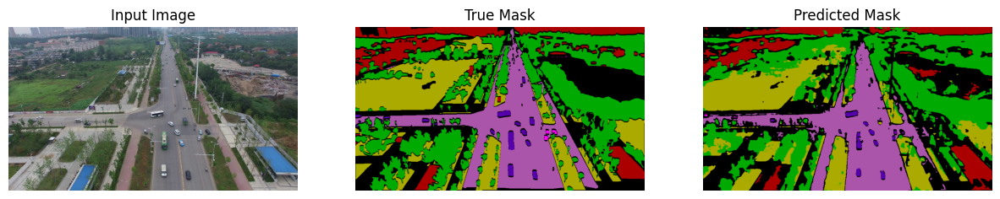

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


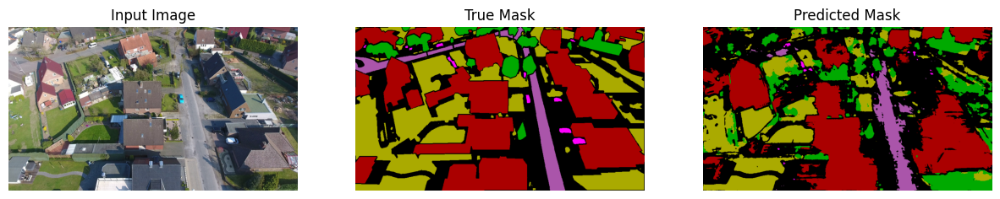

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


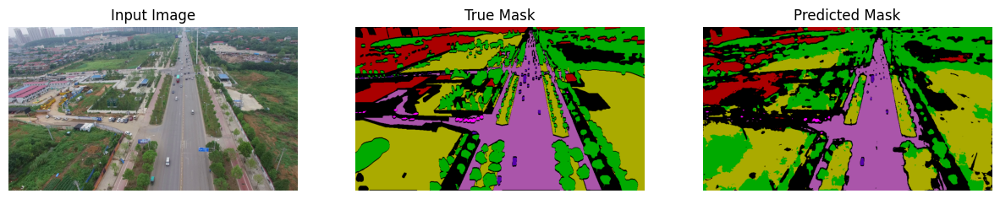

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


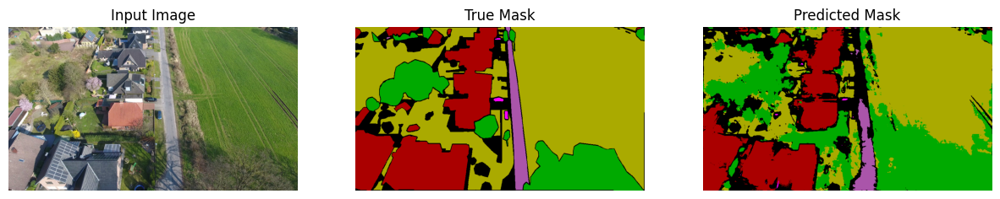

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


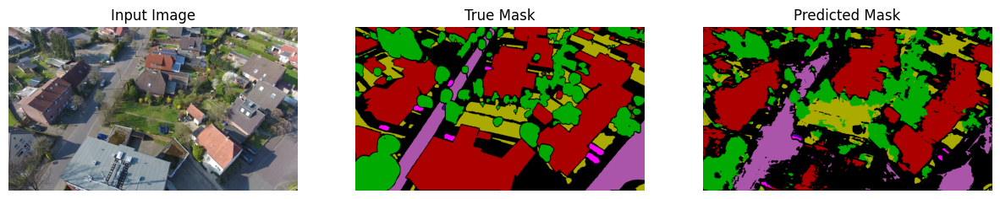

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


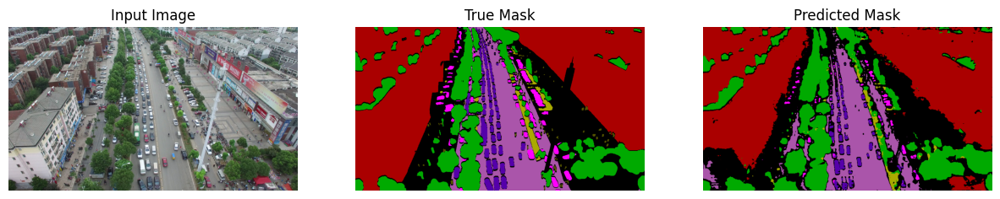

In [ ]:
show_predictions(val_finalData, 6)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


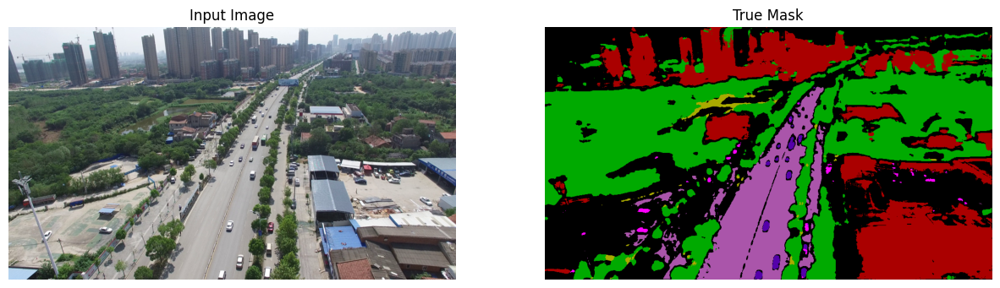

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


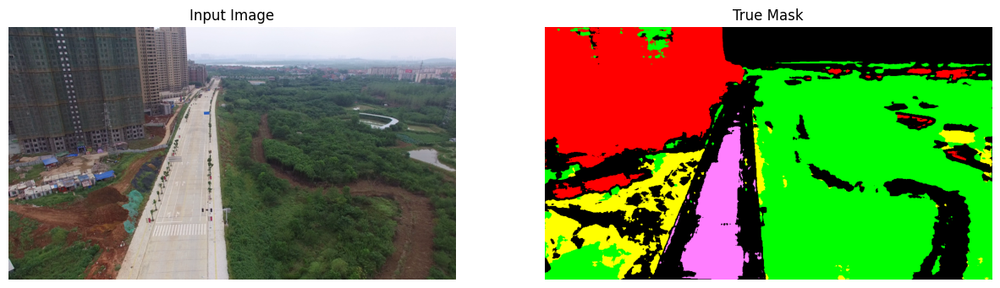

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


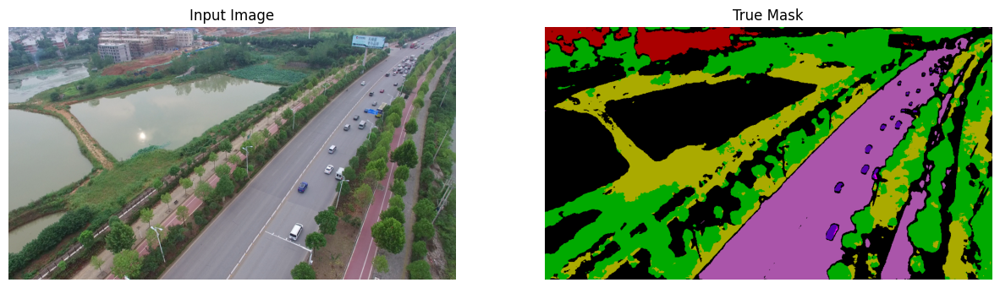

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


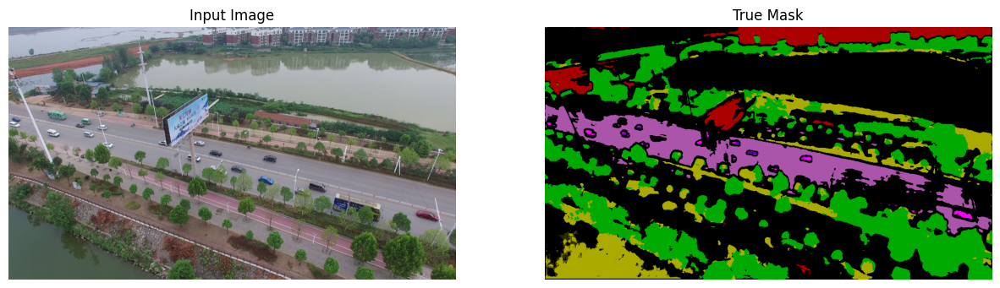

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


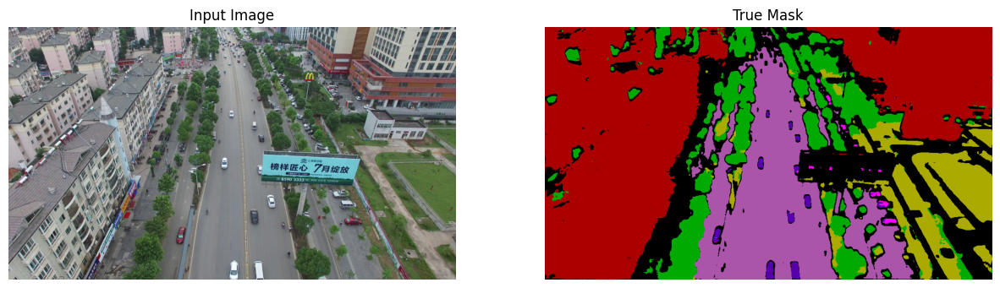

In [ ]:
# test
def testdata():
  test_image_path = '/content/IP-25/test_data/Images'
  test_image_list = sorted([os.path.join(test_image_path, i) for i in os.listdir(test_image_path)])
  test_image_filenames = tf.constant(test_image_list)
  test_dataset = tf.data.Dataset.from_tensor_slices((test_image_filenames))
  def path(image_path):
    img = tf.io.read_file(image_path)
    img = tf.image.decode_jpeg(img)
    img = tf.cast(img, tf.float32)
    return img
  def preprocess(image):
    input_image = tf.image.resize(image, [input_size[0], input_size[1]], method='nearest')
    input_image = input_image / 255.0
    return input_image

  test_image_ds = test_dataset.map(path)
  test_processed_image_ds = test_image_ds.map(preprocess)
  return test_processed_image_ds
def visualizeTest(test_Data,num=1):
  def class_to_rgb(predicted_mask):
    colorized_image = np.zeros((predicted_mask.shape[0], predicted_mask.shape[1], 3), dtype=np.uint8)
    for class_idx, color in CLASS_TO_COLOR.items():
          # Find the indices where the mask is True for the current class
        indices = np.where(predicted_mask == class_idx)
        # Assign the color to the corresponding indices in the colorized image
        colorized_image[indices[0], indices[1], :] = color
    return colorized_image

  def create_mask(pred_mask):
      pred_mask = tf.argmax(pred_mask, axis=-1)
      pred_mask = pred_mask[..., tf.newaxis]
      visual_mask = class_to_rgb(pred_mask[0].numpy())
      return visual_mask
  for image in test_Data.take(num):
    pred_mask = unet.predict(image)
    visual_mask = create_mask(pred_mask)
    display([image[0], visual_mask])


test_Data  = testdata()

test_Data.batch(BATCH_SIZE)
test_finalData = test_Data.cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
visualizeTest(test_finalData,5)

## trial 2
dropout 0.1 epoch 20 learning rate 0.01 with ReduceRlonPlateu  SGD optimizer and batchsize 5

In [5]:
def double_conv_block(inputs, num_filters, dropout_rate=0.1):
    x = Conv2D(num_filters, 3, padding="same", kernel_initializer='he_normal')(inputs)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = Conv2D(num_filters, 3, padding="same", kernel_initializer='he_normal')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    if dropout_rate > 0:
        x = Dropout(dropout_rate)(x)

    return x

def encoder_block(inputs, num_filters):
    x = double_conv_block(inputs, num_filters)
    p = MaxPool2D((2, 2), padding='same')(x)
    return x, p

def decoder_block(inputs, skip, num_filters):
    x = Conv2DTranspose(num_filters, (2, 2), strides=2, padding="same")(inputs)
    x = Concatenate()([x, skip])
    x = double_conv_block(x, num_filters)
    return x

def build_unet(input_shape):
    inputs = Input(input_shape)
    s1, p1 = encoder_block(inputs, 32)
    s2, p2 = encoder_block(p1, 64)
    s3, p3 = encoder_block(p2, 128)
    s4, p4 = encoder_block(p3, 256)

    b1 = double_conv_block(p4, 512)

    d1 = decoder_block(b1, s4, 256)
    d2 = decoder_block(d1, s3, 128)
    d3 = decoder_block(d2, s2, 64)
    d4 = decoder_block(d3, s1, 32)

    outputs = Conv2D(num_of_classes, 1, padding="same", activation="softmax")(d4)
    return tf.keras.models.Model(inputs, outputs, name="UNET")
unet2 = build_unet(input_size)
unet2.compile(
    optimizer=tf.keras.optimizers.SGD(learning_rate=0.01, momentum=0.9),
    loss='sparse_categorical_crossentropy',
    metrics=[pixel_accuracy, dice_coefficient, precision, recall, jaccard_index]
)
callbacks = [
    tf.keras.callbacks.ModelCheckpoint('best_model22.keras', save_best_only=True, monitor='val_loss'),
    tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True),
    tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=1e-6)
]
train_Data.batch(5)
train_finalData = train_Data.cache().shuffle(BUFFER_SIZE).batch(5)

val_Data.batch(5)
val_finalData = val_Data.cache().shuffle(BUFFER_SIZE).batch(5)

history = unet2.fit(
    train_finalData,
    epochs=EPOCHS,
    validation_data=val_finalData,
    callbacks=callbacks
)


Epoch 1/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 159s 1s/step - dice_coefficient: 0.1264 - jaccard_index: 0.0700 - loss: 2.0441 - pixel_accuracy: 0.2511 - precision: 0.5249 - recall: 0.3025 - val_dice_coefficient: 0.2559 - val_jaccard_index: 0.1479 - val_loss: 1.7818 - val_pixel_accuracy: 0.2620 - val_precision: 0.6003 - val_recall: 0.2928 - learning_rate: 0.0100
Epoch 2/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 85s 872ms/step - dice_coefficient: 0.2697 - jaccard_index: 0.1562 - loss: 1.3000 - pixel_accuracy: 0.4504 - precision: 0.5717 - recall: 0.6495 - val_dice_coefficient: 0.2623 - val_jaccard_index: 0.1523 - val_loss: 1.4946 - val_pixel_accuracy: 0.4166 - val_precision: 0.5927 - val_recall: 0.9898 - learning_rate: 0.0100
Epoch 3/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 35s 885ms/step - dice_coefficient: 0.2842 - jaccard_index: 0.1662 - loss: 1.2121 - pixel_accuracy: 0.4983 - precision: 0.6343 - recall: 0.7927 - val_dice_coefficient: 0.2237 - val_jaccard_index: 0.1265 - val_loss: 1.3714 - val_pixel_accuracy: 0.4024 

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


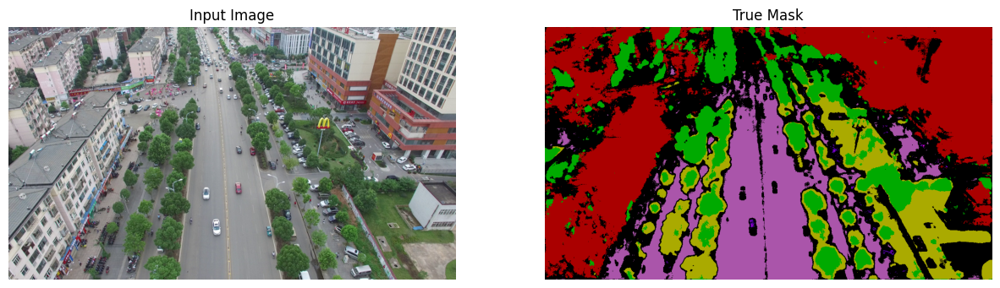

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


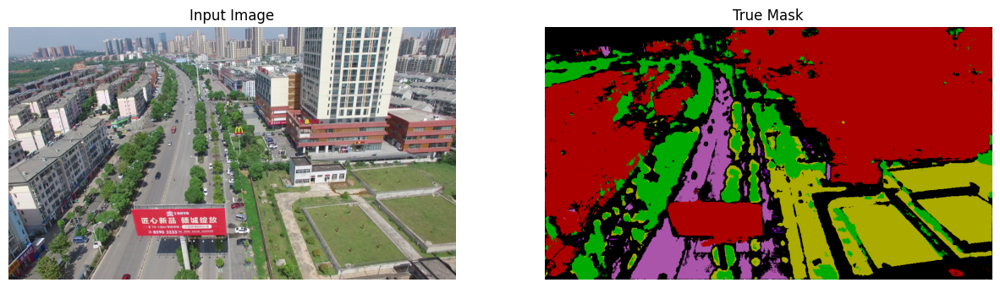

In [7]:
# test
def testdata():
  test_image_path = '/content/IP-25/test_data/Images'
  test_image_list = sorted([os.path.join(test_image_path, i) for i in os.listdir(test_image_path)])
  test_image_filenames = tf.constant(test_image_list)
  test_dataset = tf.data.Dataset.from_tensor_slices((test_image_filenames))
  def path(image_path):
    img = tf.io.read_file(image_path)
    img = tf.image.decode_jpeg(img)
    img = tf.cast(img, tf.float32)
    return img
  def preprocess(image):
    input_image = tf.image.resize(image, [input_size[0], input_size[1]], method='nearest')
    input_image = input_image / 255.0
    return input_image

  test_image_ds = test_dataset.map(path)
  test_processed_image_ds = test_image_ds.map(preprocess)
  return test_processed_image_ds
def visualizeTest(test_Data,model,num=1):
  def class_to_rgb(predicted_mask):
    colorized_image = np.zeros((predicted_mask.shape[0], predicted_mask.shape[1], 3), dtype=np.uint8)
    for class_idx, color in CLASS_TO_COLOR.items():
          # Find the indices where the mask is True for the current class
        indices = np.where(predicted_mask == class_idx)
        # Assign the color to the corresponding indices in the colorized image
        colorized_image[indices[0], indices[1], :] = color
    return colorized_image

  def create_mask(pred_mask):
      pred_mask = tf.argmax(pred_mask, axis=-1)
      pred_mask = pred_mask[..., tf.newaxis]
      visual_mask = class_to_rgb(pred_mask[0].numpy())
      return visual_mask
  for image in test_Data.take(num):
    pred_mask = model.predict(image)
    visual_mask = create_mask(pred_mask)
    display([image[0], visual_mask])


test_Data  = testdata()

test_Data.batch(5)
test_finalData = test_Data.cache().shuffle(BUFFER_SIZE).batch(5)
visualizeTest(test_finalData,unet2,2)

## trial 3
dropout 0.1 epoch 20 learning rate 0.0001 with ReduceRlonPlateu  adam optimizer and batchsize 4


  

In [8]:
def double_conv_block(inputs, num_filters, dropout_rate=0.1):
    x = Conv2D(num_filters, 3, padding="same", kernel_initializer='he_normal')(inputs)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = Conv2D(num_filters, 3, padding="same", kernel_initializer='he_normal')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    if dropout_rate > 0:
        x = Dropout(dropout_rate)(x)

    return x

def encoder_block(inputs, num_filters):
    x = double_conv_block(inputs, num_filters)
    p = MaxPool2D((2, 2), padding='same')(x)
    return x, p

def decoder_block(inputs, skip, num_filters):
    x = Conv2DTranspose(num_filters, (2, 2), strides=2, padding="same")(inputs)
    x = Concatenate()([x, skip])
    x = double_conv_block(x, num_filters)
    return x

def build_unet(input_shape):
    inputs = Input(input_shape)
    s1, p1 = encoder_block(inputs, 32)
    s2, p2 = encoder_block(p1, 64)
    s3, p3 = encoder_block(p2, 128)
    s4, p4 = encoder_block(p3, 256)

    b1 = double_conv_block(p4, 512)

    d1 = decoder_block(b1, s4, 256)
    d2 = decoder_block(d1, s3, 128)
    d3 = decoder_block(d2, s2, 64)
    d4 = decoder_block(d3, s1, 32)

    outputs = Conv2D(num_of_classes, 1, padding="same", activation="softmax")(d4)
    return tf.keras.models.Model(inputs, outputs, name="UNET")
unet3 = build_unet(input_size)
unet3.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
    loss='sparse_categorical_crossentropy',
    metrics=[pixel_accuracy, dice_coefficient, precision, recall, jaccard_index]
)
callbacks = [
    tf.keras.callbacks.ModelCheckpoint('best_model33.keras', save_best_only=True, monitor='val_loss'),
    tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True),
    tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=1e-6)
]
train_Data.batch(4)
train_finalData = train_Data.cache().shuffle(BUFFER_SIZE).batch(4)

val_Data.batch(4)
val_finalData = val_Data.cache().shuffle(BUFFER_SIZE).batch(4)
history = unet3.fit(
    train_finalData,
    epochs=EPOCHS,
    validation_data=val_finalData,
    callbacks=callbacks
)


Epoch 1/20
50/50 ━━━━━━━━━━━━━━━━━━━━ 166s 1s/step - dice_coefficient: 0.0410 - jaccard_index: 0.0211 - loss: 2.3115 - pixel_accuracy: 0.1336 - precision: 0.6427 - recall: 0.8763 - val_dice_coefficient: 0.0318 - val_jaccard_index: 0.0161 - val_loss: 2.1509 - val_pixel_accuracy: 0.0940 - val_precision: 0.6413 - val_recall: 0.0687 - learning_rate: 1.0000e-04
Epoch 2/20
50/50 ━━━━━━━━━━━━━━━━━━━━ 83s 694ms/step - dice_coefficient: 0.1551 - jaccard_index: 0.0843 - loss: 1.7605 - pixel_accuracy: 0.3932 - precision: 0.7805 - recall: 0.8997 - val_dice_coefficient: 0.0279 - val_jaccard_index: 0.0142 - val_loss: 2.7710 - val_pixel_accuracy: 0.0721 - val_precision: 0.5521 - val_recall: 0.1269 - learning_rate: 1.0000e-04
Epoch 3/20
50/50 ━━━━━━━━━━━━━━━━━━━━ 35s 705ms/step - dice_coefficient: 0.2241 - jaccard_index: 0.1266 - loss: 1.5310 - pixel_accuracy: 0.4951 - precision: 0.7613 - recall: 0.9561 - val_dice_coefficient: 0.0935 - val_jaccard_index: 0.0491 - val_loss: 3.0480 - val_pixel_accuracy:

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


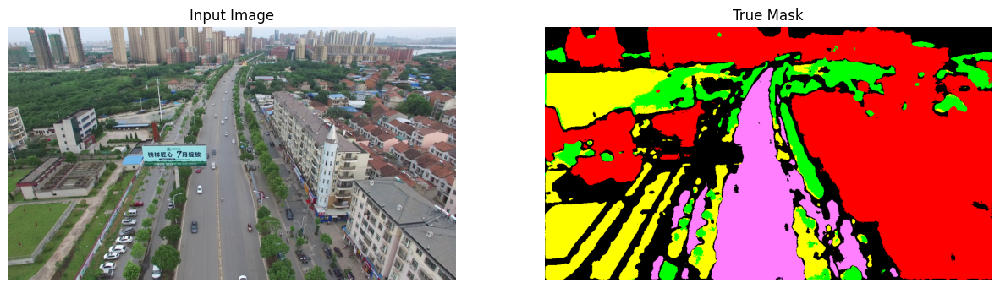

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


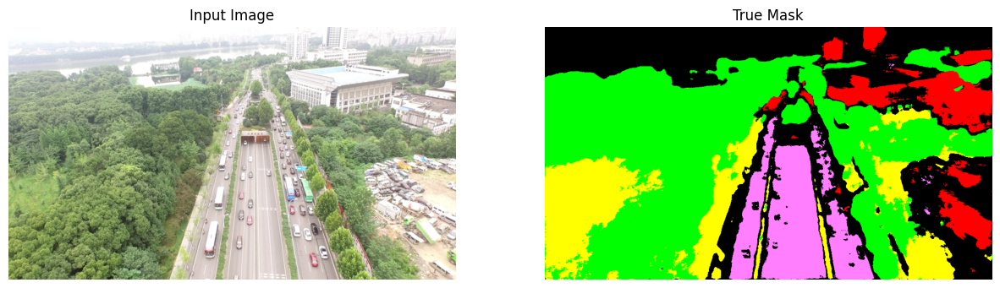

In [9]:
# test
def testdata():
  test_image_path = '/content/IP-25/test_data/Images'
  test_image_list = sorted([os.path.join(test_image_path, i) for i in os.listdir(test_image_path)])
  test_image_filenames = tf.constant(test_image_list)
  test_dataset = tf.data.Dataset.from_tensor_slices((test_image_filenames))
  def path(image_path):
    img = tf.io.read_file(image_path)
    img = tf.image.decode_jpeg(img)
    img = tf.cast(img, tf.float32)
    return img
  def preprocess(image):
    input_image = tf.image.resize(image, [input_size[0], input_size[1]], method='nearest')
    input_image = input_image / 255.0
    return input_image

  test_image_ds = test_dataset.map(path)
  test_processed_image_ds = test_image_ds.map(preprocess)
  return test_processed_image_ds
def visualizeTest(test_Data,model,num=1):
  def class_to_rgb(predicted_mask):
    colorized_image = np.zeros((predicted_mask.shape[0], predicted_mask.shape[1], 3), dtype=np.uint8)
    for class_idx, color in CLASS_TO_COLOR.items():
          # Find the indices where the mask is True for the current class
        indices = np.where(predicted_mask == class_idx)
        # Assign the color to the corresponding indices in the colorized image
        colorized_image[indices[0], indices[1], :] = color
    return colorized_image

  def create_mask(pred_mask):
      pred_mask = tf.argmax(pred_mask, axis=-1)
      pred_mask = pred_mask[..., tf.newaxis]
      visual_mask = class_to_rgb(pred_mask[0].numpy())
      return visual_mask
  for image in test_Data.take(num):
    pred_mask = model.predict(image)
    visual_mask = create_mask(pred_mask)
    display([image[0], visual_mask])


test_Data  = testdata()

test_Data.batch(4)
test_finalData = test_Data.cache().shuffle(BUFFER_SIZE).batch(4)
visualizeTest(test_finalData,unet3,2)

## trial 4
dropout 0.2 epoch 20 learning rate 0.0001 with ReduceRlonPlateu
adam optimizer and batchsize 2

In [10]:
def double_conv_block(inputs, num_filters, dropout_rate=0.2):
    x = Conv2D(num_filters, 3, padding="same", kernel_initializer='he_normal')(inputs)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = Conv2D(num_filters, 3, padding="same", kernel_initializer='he_normal')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    if dropout_rate > 0:
        x = Dropout(dropout_rate)(x)

    return x

def encoder_block(inputs, num_filters):
    x = double_conv_block(inputs, num_filters)
    p = MaxPool2D((2, 2), padding='same')(x)
    return x, p

def decoder_block(inputs, skip, num_filters):
    x = Conv2DTranspose(num_filters, (2, 2), strides=2, padding="same")(inputs)
    x = Concatenate()([x, skip])
    x = double_conv_block(x, num_filters)
    return x

def build_unet(input_shape):
    inputs = Input(input_shape)
    s1, p1 = encoder_block(inputs, 32)
    s2, p2 = encoder_block(p1, 64)
    s3, p3 = encoder_block(p2, 128)
    s4, p4 = encoder_block(p3, 256)

    b1 = double_conv_block(p4, 512)

    d1 = decoder_block(b1, s4, 256)
    d2 = decoder_block(d1, s3, 128)
    d3 = decoder_block(d2, s2, 64)
    d4 = decoder_block(d3, s1, 32)

    outputs = Conv2D(num_of_classes, 1, padding="same", activation="softmax")(d4)
    return tf.keras.models.Model(inputs, outputs, name="UNET")
unet4 = build_unet(input_size)
unet4.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
    loss='sparse_categorical_crossentropy',
    metrics=[pixel_accuracy, dice_coefficient, precision, recall, jaccard_index]
)
callbacks = [
    tf.keras.callbacks.ModelCheckpoint('best_model44.keras', save_best_only=True, monitor='val_loss'),
    tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True),
    tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=1e-6)
]

history = unet4.fit(
    train_finalData,
    epochs=EPOCHS,
    validation_data=val_finalData,
    callbacks=callbacks
)


Epoch 1/20
50/50 ━━━━━━━━━━━━━━━━━━━━ 69s 810ms/step - dice_coefficient: 0.0298 - jaccard_index: 0.0152 - loss: 2.6485 - pixel_accuracy: 0.0973 - precision: 0.5349 - recall: 0.8590 - val_dice_coefficient: 0.0355 - val_jaccard_index: 0.0181 - val_loss: 2.3742 - val_pixel_accuracy: 0.0991 - val_precision: 0.5843 - val_recall: 0.9183 - learning_rate: 1.0000e-04
Epoch 2/20
50/50 ━━━━━━━━━━━━━━━━━━━━ 37s 747ms/step - dice_coefficient: 0.1197 - jaccard_index: 0.0640 - loss: 1.9570 - pixel_accuracy: 0.3012 - precision: 0.6469 - recall: 0.8167 - val_dice_coefficient: 0.0509 - val_jaccard_index: 0.0261 - val_loss: 2.2025 - val_pixel_accuracy: 0.1253 - val_precision: 0.6103 - val_recall: 0.2201 - learning_rate: 1.0000e-04
Epoch 3/20
50/50 ━━━━━━━━━━━━━━━━━━━━ 40s 725ms/step - dice_coefficient: 0.2353 - jaccard_index: 0.1336 - loss: 1.6450 - pixel_accuracy: 0.4910 - precision: 0.7338 - recall: 0.9248 - val_dice_coefficient: 0.0666 - val_jaccard_index: 0.0345 - val_loss: 2.2447 - val_pixel_accurac

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


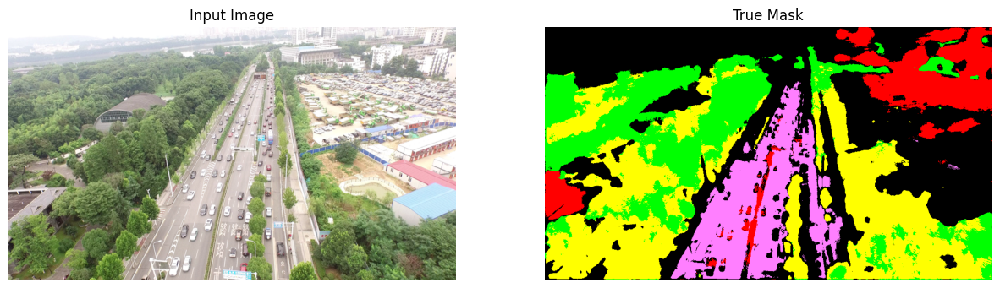

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


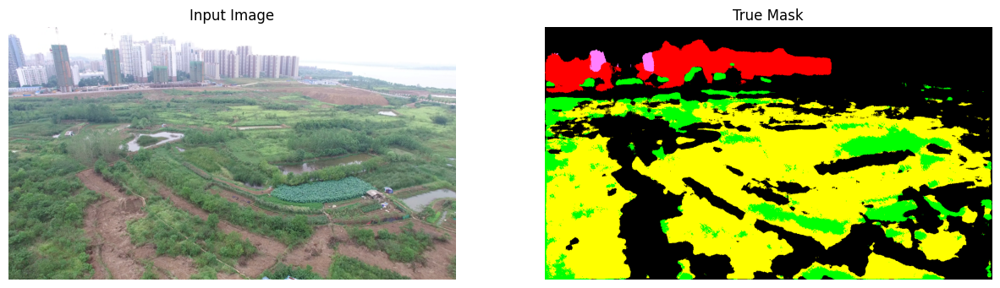

In [11]:
# test
def testdata():
  test_image_path = '/content/IP-25/test_data/Images'
  test_image_list = sorted([os.path.join(test_image_path, i) for i in os.listdir(test_image_path)])
  test_image_filenames = tf.constant(test_image_list)
  test_dataset = tf.data.Dataset.from_tensor_slices((test_image_filenames))
  def path(image_path):
    img = tf.io.read_file(image_path)
    img = tf.image.decode_jpeg(img)
    img = tf.cast(img, tf.float32)
    return img
  def preprocess(image):
    input_image = tf.image.resize(image, [input_size[0], input_size[1]], method='nearest')
    input_image = input_image / 255.0
    return input_image

  test_image_ds = test_dataset.map(path)
  test_processed_image_ds = test_image_ds.map(preprocess)
  return test_processed_image_ds
def visualizeTest(test_Data,model,num=1):
  def class_to_rgb(predicted_mask):
    colorized_image = np.zeros((predicted_mask.shape[0], predicted_mask.shape[1], 3), dtype=np.uint8)
    for class_idx, color in CLASS_TO_COLOR.items():
          # Find the indices where the mask is True for the current class
        indices = np.where(predicted_mask == class_idx)
        # Assign the color to the corresponding indices in the colorized image
        colorized_image[indices[0], indices[1], :] = color
    return colorized_image

  def create_mask(pred_mask):
      pred_mask = tf.argmax(pred_mask, axis=-1)
      pred_mask = pred_mask[..., tf.newaxis]
      visual_mask = class_to_rgb(pred_mask[0].numpy())
      return visual_mask
  for image in test_Data.take(num):
    pred_mask = model.predict(image)
    visual_mask = create_mask(pred_mask)
    display([image[0], visual_mask])


test_Data  = testdata()

test_Data.batch(BATCH_SIZE)
test_finalData = test_Data.cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
visualizeTest(test_finalData,unet4,2)

# **Modified U-net**

In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Dropout, UpSampling2D, concatenate, BatchNormalization, Activation

#modified_unet model

def modified_unet(input_size=(128, 128, 3), num_classes=8):
    inputs = Input(input_size)

    # Encoder
    c1 = Conv2D(64, (3, 3), padding='same')(inputs)
    c1 = BatchNormalization()(c1)
    c1 = Activation('relu')(c1)
    c1 = Conv2D(64, (3, 3), padding='same')(c1)
    c1 = BatchNormalization()(c1)
    c1 = Activation('relu')(c1)
    p1 = MaxPooling2D((2, 2))(c1)
    p1 = Dropout(0.2)(p1)

    c2 = Conv2D(128, (3, 3), padding='same')(p1)
    c2 = BatchNormalization()(c2)
    c2 = Activation('relu')(c2)
    c2 = Conv2D(128, (3, 3), padding='same')(c2)
    c2 = BatchNormalization()(c2)
    c2 = Activation('relu')(c2)
    p2 = MaxPooling2D((2, 2))(c2)
    p2 = Dropout(0.3)(p2)

    c3 = Conv2D(256, (3, 3), padding='same')(p2)
    c3 = BatchNormalization()(c3)
    c3 = Activation('relu')(c3)
    c3 = Conv2D(256, (3, 3), padding='same')(c3)
    c3 = BatchNormalization()(c3)
    c3 = Activation('relu')(c3)
    p3 = MaxPooling2D((2, 2))(c3)
    p3 = Dropout(0.4)(p3)

    c4 = Conv2D(512, (3, 3), padding='same')(p3)
    c4 = BatchNormalization()(c4)
    c4 = Activation('relu')(c4)
    c4 = Conv2D(512, (3, 3), padding='same')(c4)
    c4 = BatchNormalization()(c4)
    c4 = Activation('relu')(c4)
    p4 = MaxPooling2D((2, 2))(c4)
    p4 = Dropout(0.5)(p4)

    # Bottleneck with Atrous Convolutions
    c5 = Conv2D(1024, (3, 3), dilation_rate=2, padding='same')(p4)
    c5 = BatchNormalization()(c5)
    c5 = Activation('relu')(c5)
    c5 = Dropout(0.5)(c5)

    # Decoder
    u6 = UpSampling2D((2, 2))(c5)
    u6 = Conv2D(512, (2, 2), padding='same')(u6)
    u6 = BatchNormalization()(u6)
    u6 = Activation('relu')(u6)
    merge6 = concatenate([c4, u6])
    c6 = Conv2D(512, (3, 3), padding='same')(merge6)
    c6 = BatchNormalization()(c6)
    c6 = Activation('relu')(c6)
    c6 = Dropout(0.4)(c6)

    u7 = UpSampling2D((2, 2))(c6)
    u7 = Conv2D(256, (2, 2), padding='same')(u7)
    u7 = BatchNormalization()(u7)
    u7 = Activation('relu')(u7)
    merge7 = concatenate([c3, u7])
    c7 = Conv2D(256, (3, 3), padding='same')(merge7)
    c7 = BatchNormalization()(c7)
    c7 = Activation('relu')(c7)
    c7 = Dropout(0.3)(c7)

    u8 = UpSampling2D((2, 2))(c7)
    u8 = Conv2D(128, (2, 2), padding='same')(u8)
    u8 = BatchNormalization()(u8)
    u8 = Activation('relu')(u8)
    merge8 = concatenate([c2, u8])
    c8 = Conv2D(128, (3, 3), padding='same')(merge8)
    c8 = BatchNormalization()(c8)
    c8 = Activation('relu')(c8)
    c8 = Dropout(0.2)(c8)

    u9 = UpSampling2D((2, 2))(c8)
    u9 = Conv2D(64, (2, 2), padding='same')(u9)
    u9 = BatchNormalization()(u9)
    u9 = Activation('relu')(u9)
    merge9 = concatenate([c1, u9])
    c9 = Conv2D(64, (3, 3), padding='same')(merge9)
    c9 = BatchNormalization()(c9)
    c9 = Activation('relu')(c9)

    # Output layer
    outputs = Conv2D(num_classes, (1, 1), activation='softmax')(c9)

    model = tf.keras.Model(inputs, outputs)
    return model
modified_unet = build_unet(input_size)
modified_unet.compile(
    optimizer=tf.keras.optimizers.Adam(),
    loss='sparse_categorical_crossentropy',
    metrics=[pixel_accuracy, dice_coefficient, precision, recall, jaccard_index]
)
callbacks = [
    tf.keras.callbacks.ModelCheckpoint('best_modifiedmodel2.keras', save_best_only=True, monitor='val_loss'),
    tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True),
    tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=1e-6)
]

history = modified_unet.fit(
    train_finalData,
    epochs=20,
    validation_data=val_finalData,
    callbacks=callbacks
)


Epoch 1/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 70s 414ms/step - dice_coefficient: 0.2160 - jaccard_index: 0.1234 - loss: 1.6248 - pixel_accuracy: 0.4206 - precision: 0.6306 - recall: 0.9414 - val_dice_coefficient: 0.0919 - val_jaccard_index: 0.0484 - val_loss: 3.8706 - val_pixel_accuracy: 0.2162 - val_precision: 0.2267 - val_recall: 0.0313 - learning_rate: 0.0010
Epoch 2/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 62s 379ms/step - dice_coefficient: 0.3269 - jaccard_index: 0.1977 - loss: 1.1783 - pixel_accuracy: 0.5567 - precision: 0.6904 - recall: 0.8584 - val_dice_coefficient: 0.1984 - val_jaccard_index: 0.1109 - val_loss: 4.7665 - val_pixel_accuracy: 0.2953 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - learning_rate: 0.0010
Epoch 3/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 42s 393ms/step - dice_coefficient: 0.3553 - jaccard_index: 0.2185 - loss: 1.0448 - pixel_accuracy: 0.6010 - precision: 0.7209 - recall: 0.8575 - val_dice_coefficient: 0.1728 - val_jaccard_index: 0.0954 - val_loss: 1.9406 - val_pixel_a

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


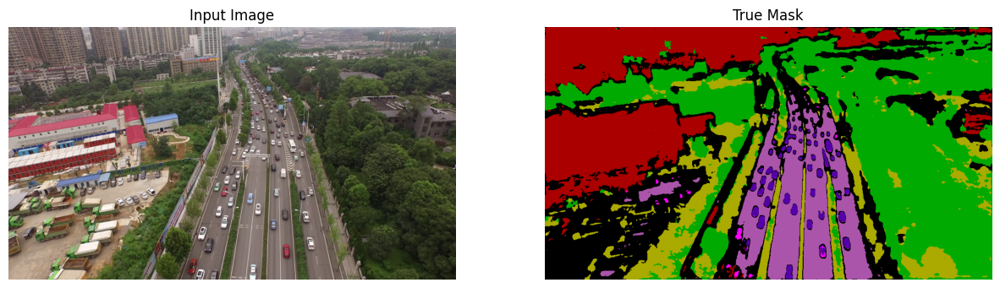

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


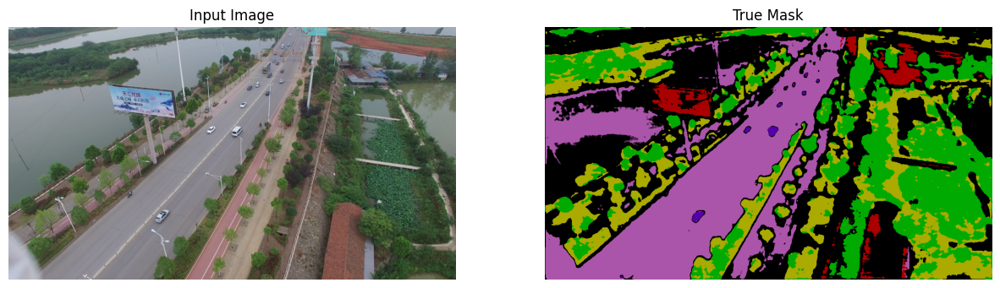

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


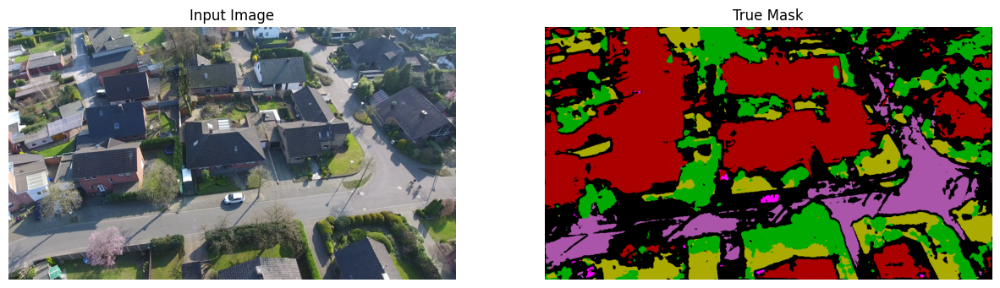

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


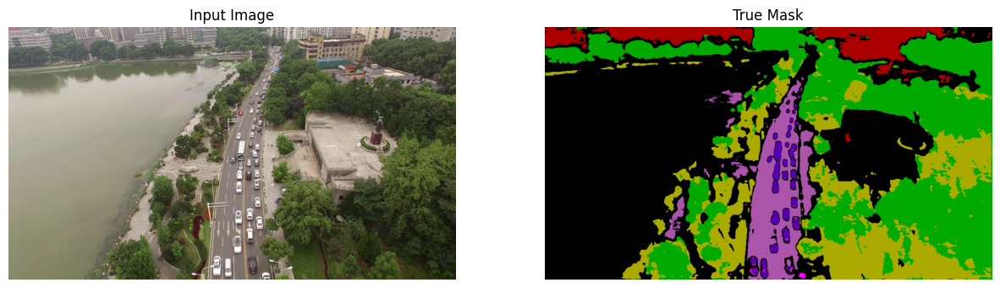

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


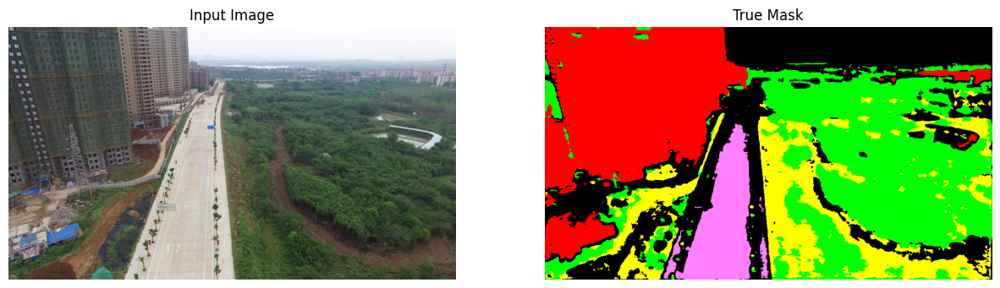

In [ ]:
# test
def testdata():
  test_image_path = '/content/IP-25/test_data/Images'
  test_image_list = sorted([os.path.join(test_image_path, i) for i in os.listdir(test_image_path)])
  test_image_filenames = tf.constant(test_image_list)
  test_dataset = tf.data.Dataset.from_tensor_slices((test_image_filenames))
  def path(image_path):
    img = tf.io.read_file(image_path)
    img = tf.image.decode_jpeg(img)
    img = tf.cast(img, tf.float32)
    return img
  def preprocess(image):
    input_image = tf.image.resize(image, [input_size[0], input_size[1]], method='nearest')
    input_image = input_image / 255.0
    return input_image

  test_image_ds = test_dataset.map(path)
  test_processed_image_ds = test_image_ds.map(preprocess)
  return test_processed_image_ds
def visualizeTest(test_Data,model,num=1):
  def class_to_rgb(predicted_mask):
    colorized_image = np.zeros((predicted_mask.shape[0], predicted_mask.shape[1], 3), dtype=np.uint8)
    for class_idx, color in CLASS_TO_COLOR.items():
          # Find the indices where the mask is True for the current class
        indices = np.where(predicted_mask == class_idx)
        # Assign the color to the corresponding indices in the colorized image
        colorized_image[indices[0], indices[1], :] = color
    return colorized_image

  def create_mask(pred_mask):
      pred_mask = tf.argmax(pred_mask, axis=-1)
      pred_mask = pred_mask[..., tf.newaxis]
      visual_mask = class_to_rgb(pred_mask[0].numpy())
      return visual_mask
  for image in test_Data.take(num):
    pred_mask = model.predict(image)
    visual_mask = create_mask(pred_mask)
    display([image[0], visual_mask])


test_Data  = testdata()

test_Data.batch(BATCH_SIZE)
test_finalData = test_Data.cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
visualizeTest(test_finalData,modified_unet,5)

## **extra trial**

In [12]:
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Dropout, UpSampling2D, concatenate, BatchNormalization, Activation
from tensorflow.keras.optimizers import RMSprop

#modified_unet model

def modified_unet(input_size=(128, 128, 3), num_classes=8):
    inputs = Input(input_size)

    # Encoder
    c1 = Conv2D(64, (3, 3), padding='same')(inputs)
    c1 = BatchNormalization()(c1)
    c1 = Activation('relu')(c1)
    c1 = Conv2D(64, (3, 3), padding='same')(c1)
    c1 = BatchNormalization()(c1)
    c1 = Activation('relu')(c1)
    p1 = MaxPooling2D((2, 2))(c1)
    p1 = Dropout(0.2)(p1)

    c2 = Conv2D(128, (3, 3), padding='same')(p1)
    c2 = BatchNormalization()(c2)
    c2 = Activation('relu')(c2)
    c2 = Conv2D(128, (3, 3), padding='same')(c2)
    c2 = BatchNormalization()(c2)
    c2 = Activation('relu')(c2)
    p2 = MaxPooling2D((2, 2))(c2)
    p2 = Dropout(0.3)(p2)

    c3 = Conv2D(256, (3, 3), padding='same')(p2)
    c3 = BatchNormalization()(c3)
    c3 = Activation('relu')(c3)
    c3 = Conv2D(256, (3, 3), padding='same')(c3)
    c3 = BatchNormalization()(c3)
    c3 = Activation('relu')(c3)
    p3 = MaxPooling2D((2, 2))(c3)
    p3 = Dropout(0.4)(p3)

    c4 = Conv2D(512, (3, 3), padding='same')(p3)
    c4 = BatchNormalization()(c4)
    c4 = Activation('relu')(c4)
    c4 = Conv2D(512, (3, 3), padding='same')(c4)
    c4 = BatchNormalization()(c4)
    c4 = Activation('relu')(c4)
    p4 = MaxPooling2D((2, 2))(c4)
    p4 = Dropout(0.5)(p4)

    # Bottleneck with Atrous Convolutions
    c5 = Conv2D(1024, (3, 3), dilation_rate=2, padding='same')(p4)
    c5 = BatchNormalization()(c5)
    c5 = Activation('relu')(c5)
    c5 = Dropout(0.5)(c5)

    # Decoder
    u6 = UpSampling2D((2, 2))(c5)
    u6 = Conv2D(512, (2, 2), padding='same')(u6)
    u6 = BatchNormalization()(u6)
    u6 = Activation('relu')(u6)
    merge6 = concatenate([c4, u6])
    c6 = Conv2D(512, (3, 3), padding='same')(merge6)
    c6 = BatchNormalization()(c6)
    c6 = Activation('relu')(c6)
    c6 = Dropout(0.4)(c6)

    u7 = UpSampling2D((2, 2))(c6)
    u7 = Conv2D(256, (2, 2), padding='same')(u7)
    u7 = BatchNormalization()(u7)
    u7 = Activation('relu')(u7)
    merge7 = concatenate([c3, u7])
    c7 = Conv2D(256, (3, 3), padding='same')(merge7)
    c7 = BatchNormalization()(c7)
    c7 = Activation('relu')(c7)
    c7 = Dropout(0.3)(c7)

    u8 = UpSampling2D((2, 2))(c7)
    u8 = Conv2D(128, (2, 2), padding='same')(u8)
    u8 = BatchNormalization()(u8)
    u8 = Activation('relu')(u8)
    merge8 = concatenate([c2, u8])
    c8 = Conv2D(128, (3, 3), padding='same')(merge8)
    c8 = BatchNormalization()(c8)
    c8 = Activation('relu')(c8)
    c8 = Dropout(0.2)(c8)

    u9 = UpSampling2D((2, 2))(c8)
    u9 = Conv2D(64, (2, 2), padding='same')(u9)
    u9 = BatchNormalization()(u9)
    u9 = Activation('relu')(u9)
    merge9 = concatenate([c1, u9])
    c9 = Conv2D(64, (3, 3), padding='same')(merge9)
    c9 = BatchNormalization()(c9)
    c9 = Activation('relu')(c9)

    # Output layer
    outputs = Conv2D(num_classes, (1, 1), activation='softmax')(c9)

    model = tf.keras.Model(inputs, outputs)
    return model
modified_unet2 = build_unet(input_size)
modified_unet2.compile(
    optimizer=RMSprop(learning_rate=0.001),
    loss='sparse_categorical_crossentropy',
    metrics=[pixel_accuracy, dice_coefficient, precision, recall, jaccard_index]
)
callbacks = [
    tf.keras.callbacks.ModelCheckpoint('best_modifiedmodel2.keras', save_best_only=True, monitor='val_loss'),
    tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True),
    tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=1e-6)
]
train_Data.batch(3)
train_finalData = train_Data.cache().shuffle(BUFFER_SIZE).batch(3)

val_Data.batch(3)
val_finalData = val_Data.cache().shuffle(BUFFER_SIZE).batch(3)
history = modified_unet2.fit(
    train_finalData,
    epochs=10,
    validation_data=val_finalData,
    callbacks=callbacks
)


Epoch 1/10
67/67 ━━━━━━━━━━━━━━━━━━━━ 193s 1s/step - dice_coefficient: 0.2075 - jaccard_index: 0.1178 - loss: 1.6237 - pixel_accuracy: 0.3933 - precision: 0.6181 - recall: 0.5975 - val_dice_coefficient: 0.1395 - val_jaccard_index: 0.0751 - val_loss: 2.0117 - val_pixel_accuracy: 0.2513 - val_precision: 0.6641 - val_recall: 0.1431 - learning_rate: 0.0010
Epoch 2/10
67/67 ━━━━━━━━━━━━━━━━━━━━ 53s 541ms/step - dice_coefficient: 0.3337 - jaccard_index: 0.2016 - loss: 1.1634 - pixel_accuracy: 0.5580 - precision: 0.7197 - recall: 0.8249 - val_dice_coefficient: 0.1165 - val_jaccard_index: 0.0619 - val_loss: 2.0603 - val_pixel_accuracy: 0.2281 - val_precision: 0.4572 - val_recall: 0.0773 - learning_rate: 0.0010
Epoch 3/10
67/67 ━━━━━━━━━━━━━━━━━━━━ 41s 543ms/step - dice_coefficient: 0.3527 - jaccard_index: 0.2158 - loss: 1.0680 - pixel_accuracy: 0.5901 - precision: 0.7628 - recall: 0.8237 - val_dice_coefficient: 0.0571 - val_jaccard_index: 0.0295 - val_loss: 6.9579 - val_pixel_accuracy: 0.1037 

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 987ms/step


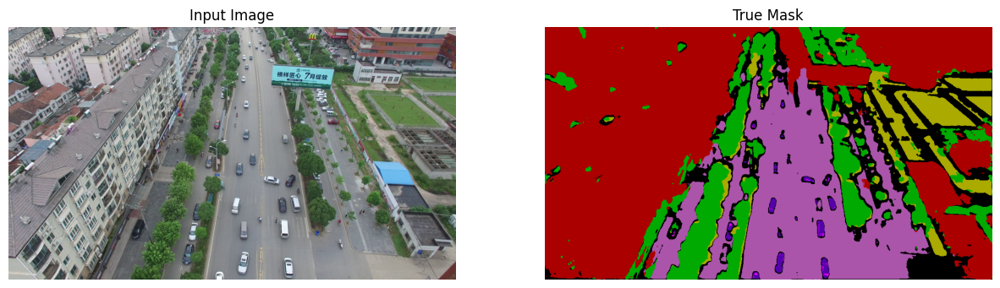

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


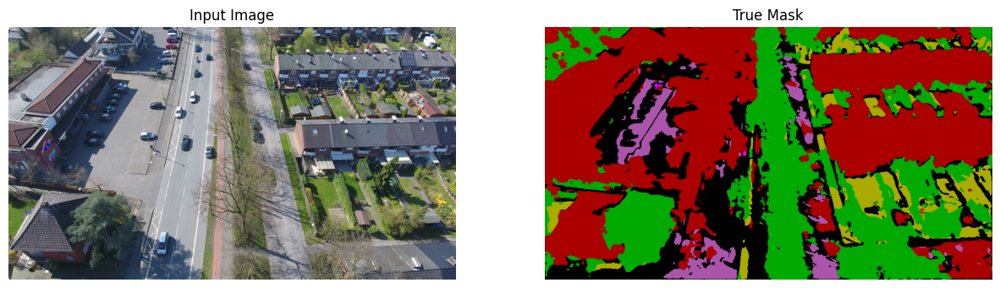

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


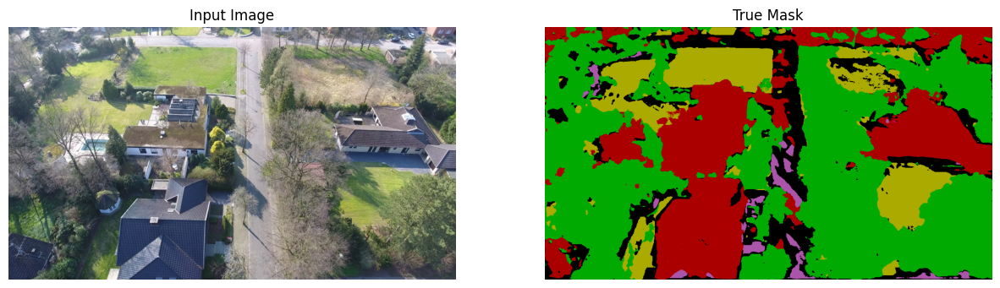

In [13]:
# test
def testdata():
  test_image_path = '/content/IP-25/test_data/Images'
  test_image_list = sorted([os.path.join(test_image_path, i) for i in os.listdir(test_image_path)])
  test_image_filenames = tf.constant(test_image_list)
  test_dataset = tf.data.Dataset.from_tensor_slices((test_image_filenames))
  def path(image_path):
    img = tf.io.read_file(image_path)
    img = tf.image.decode_jpeg(img)
    img = tf.cast(img, tf.float32)
    return img
  def preprocess(image):
    input_image = tf.image.resize(image, [input_size[0], input_size[1]], method='nearest')
    input_image = input_image / 255.0
    return input_image

  test_image_ds = test_dataset.map(path)
  test_processed_image_ds = test_image_ds.map(preprocess)
  return test_processed_image_ds
def visualizeTest(test_Data,model,num=1):
  def class_to_rgb(predicted_mask):
    colorized_image = np.zeros((predicted_mask.shape[0], predicted_mask.shape[1], 3), dtype=np.uint8)
    for class_idx, color in CLASS_TO_COLOR.items():
          # Find the indices where the mask is True for the current class
        indices = np.where(predicted_mask == class_idx)
        # Assign the color to the corresponding indices in the colorized image
        colorized_image[indices[0], indices[1], :] = color
    return colorized_image

  def create_mask(pred_mask):
      pred_mask = tf.argmax(pred_mask, axis=-1)
      pred_mask = pred_mask[..., tf.newaxis]
      visual_mask = class_to_rgb(pred_mask[0].numpy())
      return visual_mask
  for image in test_Data.take(num):
    pred_mask = model.predict(image)
    visual_mask = create_mask(pred_mask)
    display([image[0], visual_mask])


test_Data  = testdata()

test_Data.batch(3)
test_finalData = test_Data.cache().shuffle(BUFFER_SIZE).batch(3)
visualizeTest(test_finalData,modified_unet2,3)

# **deeplab**

In [ ]:
#transfer learning model
from tensorflow.keras import layers, models, optimizers
from tensorflow.keras.applications import MobileNetV2
def build_deeplabv3(input_shape, num_classes):
    # Load MobileNetV2 backbone
    base_model = MobileNetV2(input_shape=input_shape, include_top=False, weights='imagenet')
    base_model.trainable = False  # Freeze backbone initially

    x = base_model.output

    # Add convolution and upsampling layers
    x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
    upsample_factor = input_shape[0] // x.shape[1]
    x = layers.UpSampling2D(size=(upsample_factor, upsample_factor), interpolation='bilinear')(x)
    outputs = layers.Conv2D(num_classes, (1, 1), activation='softmax')(x)

    return models.Model(inputs=base_model.input, outputs=outputs)

deeplab = build_unet(input_size)
deeplab.compile(
    optimizer=tf.keras.optimizers.Adam(),
    loss='sparse_categorical_crossentropy',
    metrics=[pixel_accuracy, dice_coefficient, precision, recall, jaccard_index]
)
callbacks = [
    tf.keras.callbacks.ModelCheckpoint('best_deeplab.keras', save_best_only=True, monitor='val_loss'),
    tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True),
    tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=1e-6)
]

history = deeplab.fit(
    train_finalData,
    epochs=20,
    validation_data=val_finalData,
    callbacks=callbacks
)

Epoch 1/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 66s 404ms/step - dice_coefficient: 0.2559 - jaccard_index: 0.1502 - loss: 1.5445 - pixel_accuracy: 0.4427 - precision: 0.6532 - recall: 0.7119 - val_dice_coefficient: 0.0567 - val_jaccard_index: 0.0293 - val_loss: 12.1774 - val_pixel_accuracy: 0.1050 - val_precision: 0.7386 - val_recall: 0.7244 - learning_rate: 0.0010
Epoch 2/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 65s 380ms/step - dice_coefficient: 0.3302 - jaccard_index: 0.1995 - loss: 1.1308 - pixel_accuracy: 0.5625 - precision: 0.7111 - recall: 0.8156 - val_dice_coefficient: 0.0919 - val_jaccard_index: 0.0484 - val_loss: 14.5795 - val_pixel_accuracy: 0.2218 - val_precision: 0.0933 - val_recall: 0.0965 - learning_rate: 0.0010
Epoch 3/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 41s 412ms/step - dice_coefficient: 0.3460 - jaccard_index: 0.2110 - loss: 1.0618 - pixel_accuracy: 0.5916 - precision: 0.7103 - recall: 0.8355 - val_dice_coefficient: 0.2616 - val_jaccard_index: 0.1525 - val_loss: 1.5158 - val_pixel_accurac

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


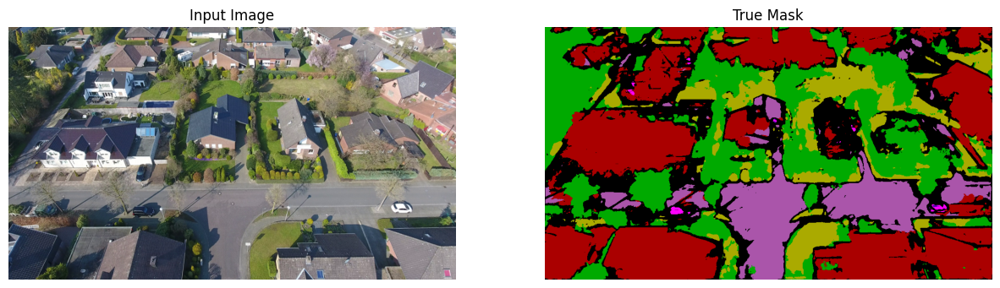

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


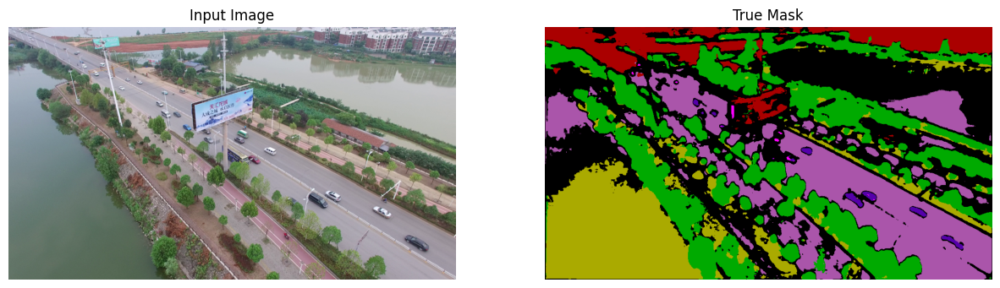

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


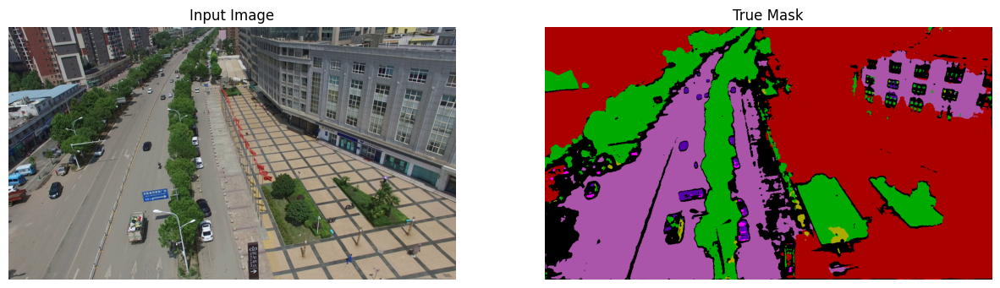

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


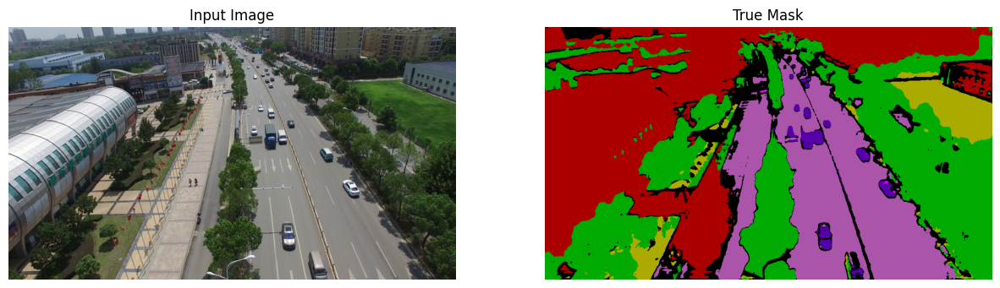

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


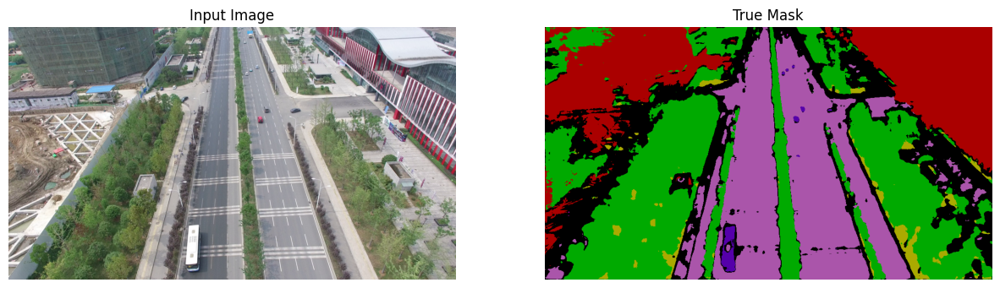

In [ ]:
visualizeTest(test_finalData,deeplab,5)

## **extra trial**

In [14]:
#transfer learning model
from tensorflow.keras import layers, models, optimizers
from tensorflow.keras.applications import MobileNetV2
def build_deeplabv3(input_shape, num_classes):
    # Load MobileNetV2 backbone
    base_model = MobileNetV2(input_shape=input_shape, include_top=False, weights='imagenet')
    base_model.trainable = False  # Freeze backbone initially

    x = base_model.output

    # Add convolution and upsampling layers
    x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
    upsample_factor = input_shape[0] // x.shape[1]
    x = layers.UpSampling2D(size=(upsample_factor, upsample_factor), interpolation='bilinear')(x)
    outputs = layers.Conv2D(num_classes, (1, 1), activation='softmax')(x)

    return models.Model(inputs=base_model.input, outputs=outputs)

deeplab2 = build_unet(input_size)
deeplab2.compile(
    optimizer=RMSprop(learning_rate=0.001),
    loss='sparse_categorical_crossentropy',
    metrics=[pixel_accuracy, dice_coefficient, precision, recall, jaccard_index]
)
callbacks = [
    tf.keras.callbacks.ModelCheckpoint('best_deeplab.keras', save_best_only=True, monitor='val_loss'),
    tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True),
    tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=1e-6)
]
train_Data.batch(3)
train_finalData = train_Data.cache().shuffle(BUFFER_SIZE).batch(3)

val_Data.batch(3)
val_finalData = val_Data.cache().shuffle(BUFFER_SIZE).batch(3)
history = deeplab2.fit(
    train_finalData,
    epochs=10,
    validation_data=val_finalData,
    callbacks=callbacks
)

Epoch 1/10
67/67 ━━━━━━━━━━━━━━━━━━━━ 122s 1s/step - dice_coefficient: 0.2123 - jaccard_index: 0.1209 - loss: 1.6249 - pixel_accuracy: 0.4063 - precision: 0.6209 - recall: 0.7180 - val_dice_coefficient: 0.0897 - val_jaccard_index: 0.0471 - val_loss: 1.8748 - val_pixel_accuracy: 0.1752 - val_precision: 0.8428 - val_recall: 0.0630 - learning_rate: 0.0010
Epoch 2/10
67/67 ━━━━━━━━━━━━━━━━━━━━ 64s 535ms/step - dice_coefficient: 0.3325 - jaccard_index: 0.2009 - loss: 1.1525 - pixel_accuracy: 0.5745 - precision: 0.7432 - recall: 0.8525 - val_dice_coefficient: 0.0885 - val_jaccard_index: 0.0465 - val_loss: 2.4338 - val_pixel_accuracy: 0.1831 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - learning_rate: 0.0010
Epoch 3/10
67/67 ━━━━━━━━━━━━━━━━━━━━ 36s 545ms/step - dice_coefficient: 0.3779 - jaccard_index: 0.2349 - loss: 0.9856 - pixel_accuracy: 0.6305 - precision: 0.7917 - recall: 0.8702 - val_dice_coefficient: 0.0866 - val_jaccard_index: 0.0454 - val_loss: 2.9172 - val_pixel_accuracy:

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


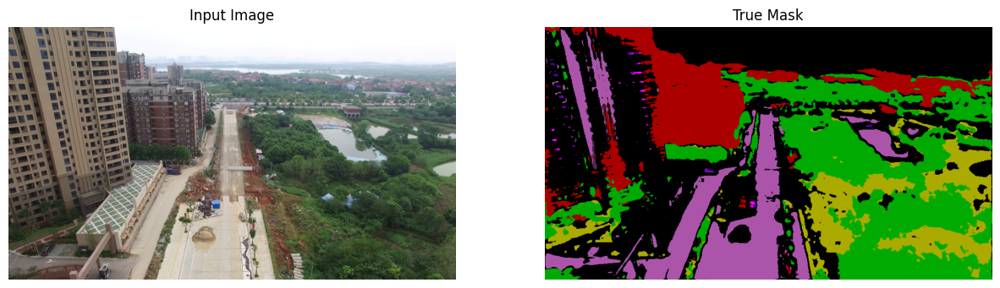

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


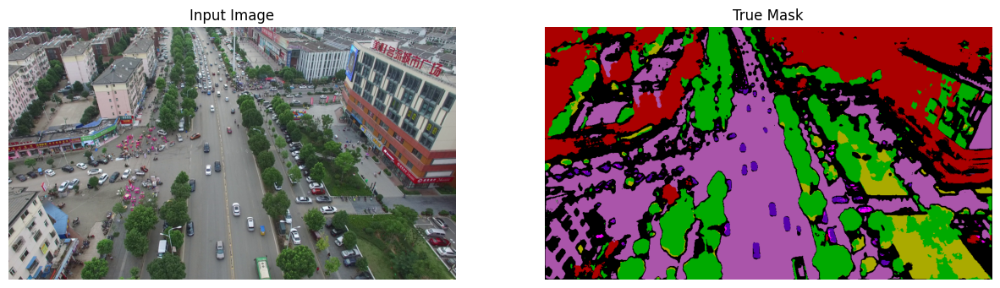

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


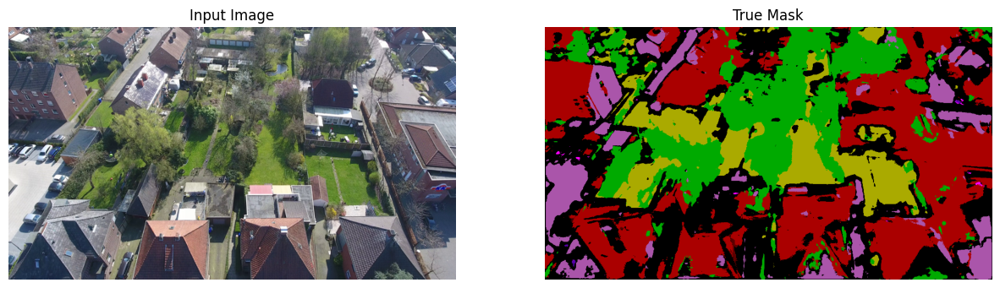

In [16]:
visualizeTest(test_finalData,deeplab2,3)